### GDF Comparateur de territoires

In [1]:
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt
import contextily as cx

file_path = 'data/France/transportsIDF/comparateur.geojson'

try:
    # Use the read_file function
    gdf_comp = gpd.read_file(file_path)

    print("GeoJSON file opened successfully using 'geopandas'.")
    print("\nHead of the GeoDataFrame:")
    print(gdf_comp.head())
    print("\nGeoDataFrame Information:")
    gdf_comp.info()
    

except ImportError:
    print("Error: 'geopandas' is not installed. Please run 'pip install geopandas'.")
except Exception as e:
    print(f"An error occurred: {e}")

GeoJSON file opened successfully using 'geopandas'.

Head of the GeoDataFrame:
  codgeo nom_officiel_commune_arrondissement_municipal  p20_pop  p14_pop  \
0  77121                                     Collégien     3339     3329   
1  77249                                       Lésigny     7125     7387   
2  77273                                   Marchémoret      594      557   
3  78010                            Les Alluets-le-Roi     1215     1237   
4  78036                                    Autouillet      612      470   

   superf  nais1420  dece1420      p20_men  naisd22  decesd22  ...  etbe21  \
0    4.27       221        73  1258.000000       29        16  ...      44   
1   10.13       331       243  2754.688016       53        34  ...       3   
2    7.04        24         8   202.907726        8         4  ...       0   
3    7.39        56        44   464.300630       12         6  ...       1   
4    4.93        29        14   227.601970        7         1  ...       1

In [2]:
import geopandas as gpd
import json

file_path = 'data/France/transportsIDF/traces.geojson'

try:
    # Use the read_file function
    gdf = gpd.read_file(file_path)
    gdf['geo_point_2d'] = gdf['geo_point_2d'].apply(json.loads)

    print("GeoJSON file opened successfully using 'geopandas'.")
    print("\nHead of the GeoDataFrame:")
    print(gdf.head())
    print("\nGeoDataFrame Information:")
    gdf.info()
    

except ImportError:
    print("Error: 'geopandas' is not installed. Please run 'pip install geopandas'.")
except Exception as e:
    print(f"An error occurred: {e}")

GeoJSON file opened successfully using 'geopandas'.

Head of the GeoDataFrame:
                                        geo_point_2d idrefliga idrefligc  \
0  {'lon': 2.404685043965258, 'lat': 48.836095049...    A01541    C01378   
1  {'lon': 2.245874666432102, 'lat': 48.989357515...    A01840    C01727   
2  {'lon': 2.382356387625525, 'lat': 48.856480109...    A01542    C01379   
3  {'lon': 2.0691567761066754, 'lat': 48.79821094...    A01847    C01736   
4  {'lon': 2.1495320290864575, 'lat': 48.79620666...    A01840    C01727   

   res_com             reseau   mode  train  rer  metro  tramway  ...  \
0  METRO 8              METRO  METRO      0    0      1        0  ...   
1    RER C              RER C    RER      0    1      0        0  ...   
2  METRO 9              METRO  METRO      0    0      1        0  ...   
3  TRAIN N  PARIS RIVE GAUCHE  TRAIN      1    0      0        0  ...   
4    RER C              RER C    RER      0    1      0        0  ...   

                   date_m

Generating choropleth map...


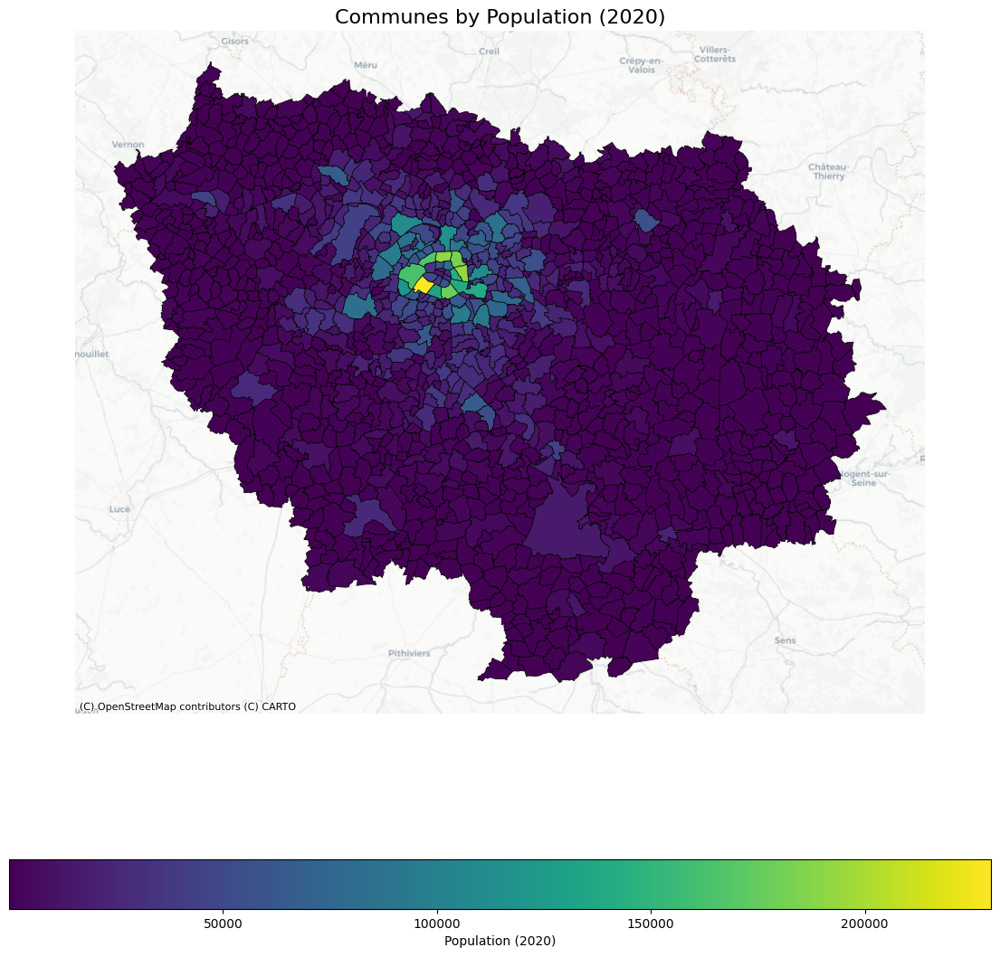

Visualization successful. The map displays a choropleth of the communes based on the 'p20_pop' column. ✅


In [3]:
gdf_comp_mercator = gdf_comp.to_crs(epsg=3857) 

# 2. Create the plot figure
print("Generating choropleth map...")
fig, ax = plt.subplots(1, 1, figsize=(14, 14))

# Plot the GeoDataFrame
gdf_comp_mercator.plot(
    column='p20_pop',  # Use the 2020 population for color intensity
    ax=ax,
    legend=True,
    cmap='viridis',    # Use a color map suitable for continuous data
    edgecolor='black', # Draw borders between the polygons
    linewidth=0.5,
    legend_kwds={'label': "Population (2020)",
                 'orientation': "horizontal"}
)

# 3. Add a basemap for context (using CartoDB Positron as Stamen is unavailable)
cx.add_basemap(ax, source=cx.providers.CartoDB.Positron)

# Set map labels and display
ax.set_title('Communes by Population (2020)', fontsize=16)
ax.set_axis_off()
plt.show()
print("Visualization successful. The map displays a choropleth of the communes based on the 'p20_pop' column. ✅")

### GDF Stations

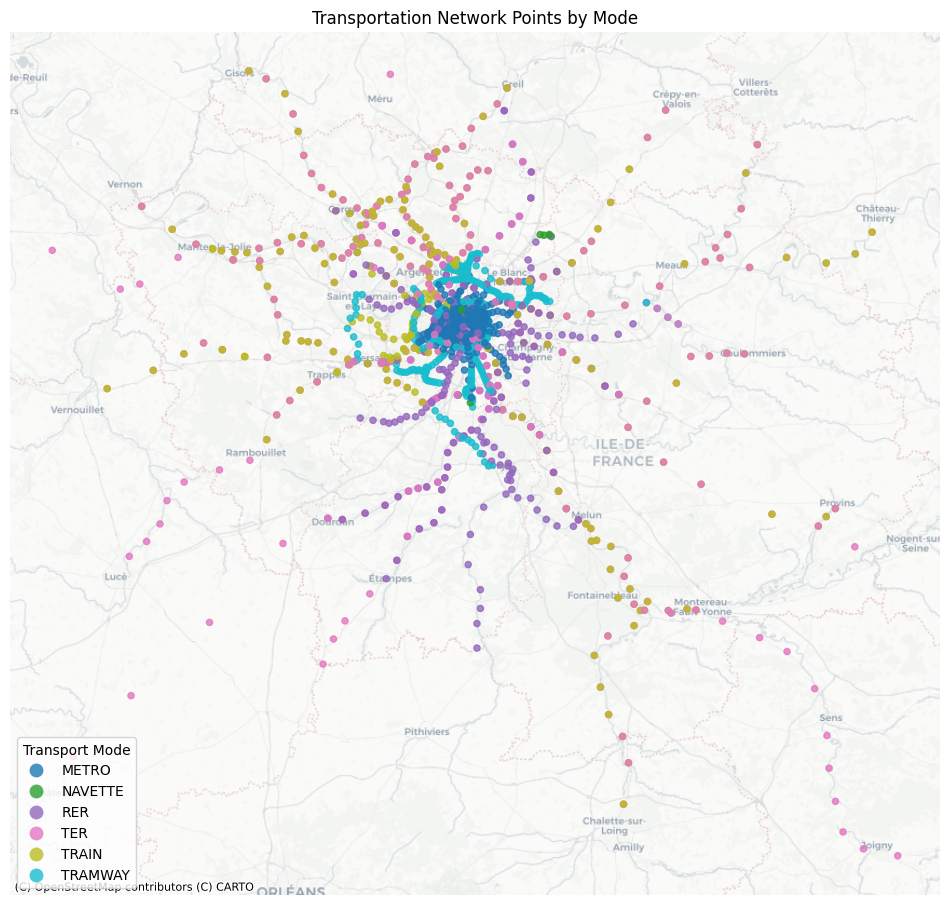

In [ ]:
# --- Assume your GeoDataFrame is loaded as 'gdf' ---
# 1. Ensure the 'geometry' column is created from 'geo_point_2d'
# We extract the 'lon' and 'lat' and create a shapely Point object
gdf['geometry'] = gdf.apply(
    lambda row: Point(row['geo_point_2d']['lon'], row['geo_point_2d']['lat']), 
    axis=1
)

# 2. Re-create the GeoDataFrame with the new geometry column
gdf = gpd.GeoDataFrame(gdf, geometry='geometry', crs="EPSG:4326")

# 3. Project to Web Mercator (EPSG:3857) for compatibility with basemaps
gdf_mercator = gdf.to_crs(epsg=3857) 

# 4. Create the plot
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

# Plot the data, colored by the 'mode' column
gdf_mercator.plot(
    column='mode',  # Color-code based on transport mode (METRO, RER, TRAIN)
    ax=ax,
    legend=True,  # Show the legend for colors
    markersize=20, 
    alpha=0.8,
    legend_kwds={'title': 'Transport Mode', 'loc': 'lower left'}
)

# 5. Add a basemap for geographical context
#cx.add_basemap(ax, source=cx.providers.OpenStreetMap.Mapnik)
cx.add_basemap(ax, source=cx.providers.CartoDB.Positron)
# Set map labels and display
ax.set_title('Transportation Network Points by Mode')
ax.set_axis_off() # Hide lat/lon axis labels for a cleaner map view
plt.show()

In [9]:
# Ensure both are in the same CRS
print(gdf.crs, gdf_comp.crs)
gdf = gdf.to_crs(gdf_comp.crs)

# Spatial join: assign each station to the city polygon it belongs to
stations = gpd.sjoin(
    gdf, gdf_comp[["codgeo", "geometry"]], 
    how="inner", 
    predicate="within"
)

stations.head()

EPSG:4326 EPSG:4326


,geo_point_2d,idrefliga,idrefligc,res_com,reseau,mode,train,rer,metro,tramway,...,extcode,indice_lig,shape_leng,colourweb_hexa,colourprint_cmjn,picto,picto_final,geometry,index_right,codgeo
0,"{'lon': 2.404685043965258, 'lat': 48.836095049...",A01541,C01378,METRO 8,METRO,METRO,0,0,1,0,...,100110008:8,8,452.342196,d282be,21 38 0 0,None,https://data.iledefrance-mobilites.fr/explore/...,POINT (2.40469 48.8361),664,75112
1,"{'lon': 2.245874666432102, 'lat': 48.989357515...",A01840,C01727,RER C,RER C,RER,0,1,0,0,...,800:C,C,1954.613148,ffcc30,0 19 100 0,None,https://data.iledefrance-mobilites.fr/explore/...,POINT (2.24587 48.98936),40,95219
2,"{'lon': 2.382356387625525, 'lat': 48.856480109...",A01542,C01379,METRO 9,METRO,METRO,0,0,1,0,...,100110009:9,9,462.290569,b6bd00,4 0 100 26,None,https://data.iledefrance-mobilites.fr/explore/...,POINT (2.38236 48.85648),984,75111
3,"{'lon': 2.0691567761066754, 'lat': 48.79821094...",A01847,C01736,TRAIN N,PARIS RIVE GAUCHE,TRAIN,1,0,0,0,...,800:N,N,412.815832,00b297,82 0 54 0,None,https://data.iledefrance-mobilites.fr/explore/...,POINT (2.06916 48.79821),1212,78545
4,"{'lon': 2.1495320290864575, 'lat': 48.79620666...",A01840,C01727,RER C,RER C,RER,0,1,0,0,...,800:C,C,1102.104401,ffcc30,0 19 100 0,None,https://data.iledefrance-mobilites.fr/explore/...,POINT (2.14953 48.79621),32,78646


In [11]:
weights = {
    "rer": 3,
    "metro": 2,
    "train": 2,
    "tramway": 1,
    "val": 1
}

import itertools
import networkx as nx

G = nx.Graph()

# Group stations by line
for line_id, group in stations.groupby("idrefligc"):
    # Cities served by this line
    cities = group["codgeo"].unique()
    
    # Which mode is it? (pick the one with value 1 in the group)
    modes = {
        mode: int(group[mode].max())  # check if line is that mode
        for mode in weights.keys()
    }
    # pick the strongest mode present
    line_mode = max(modes, key=lambda m: modes[m])
    if modes[line_mode] == 0:
        continue
    line_weight = weights[line_mode]
    
    # Add edges between all city pairs served by this line
    for c1, c2 in itertools.combinations(cities, 2):
        if G.has_edge(c1, c2):
            G[c1][c2]["weight"] += line_weight
        else:
            G.add_edge(c1, c2, weight=line_weight, line_ids=[line_id])


In [26]:
gdf_comp.loc[gdf_comp["nom_officiel_commune_arrondissement_municipal"] == "Courbevoie"]

,codgeo,nom_officiel_commune_arrondissement_municipal,p20_pop,p14_pop,superf,nais1420,dece1420,p20_men,naisd22,decesd22,...,etfz21,etgu21,etgz21,etoq21,ettef121,ettefp1021,idf,geo_point,geometry,centroid
440,92026,Courbevoie,82074,84658,4.17,7944,2757,39514.447569,1014,504,...,157,2883,483,265,2249,908,Oui,"{ ""lon"": 2.2556949164364495, ""lat"": 48.8984142...","POLYGON ((2.28427 48.90229, 2.28185 48.90462, ...",POINT (2.25569 48.89841)


In [ ]:
G[]

KeyError: 92064

In [27]:
G.edges['92073', '92026']

{'weight': 3, 'line_ids': ['C01390']}

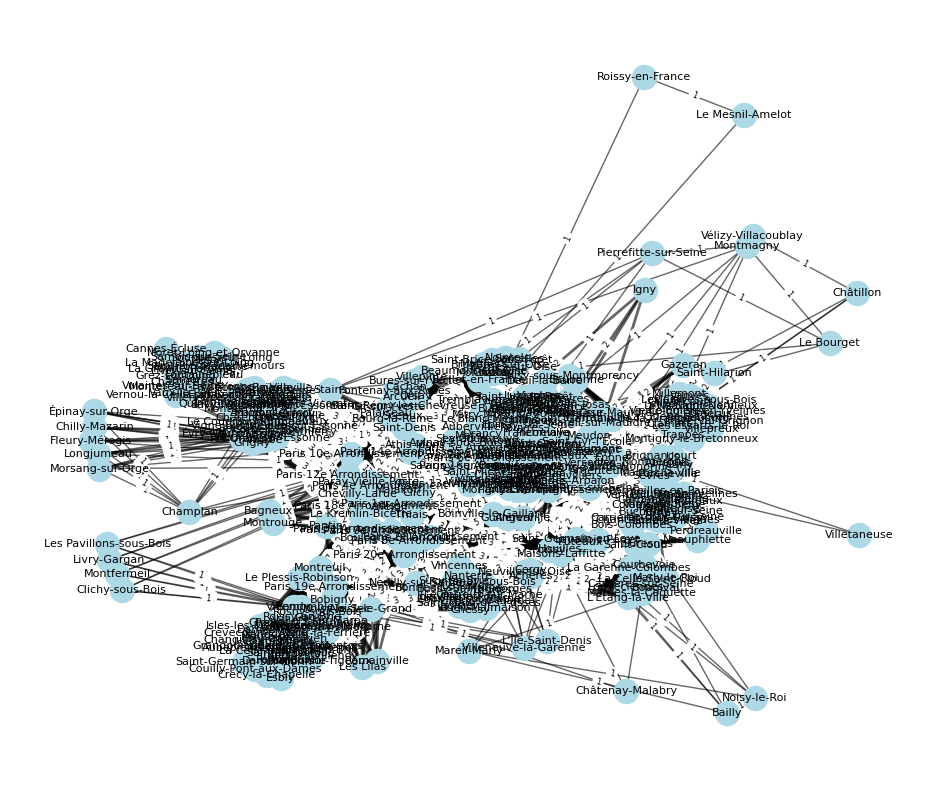

In [14]:
import matplotlib.pyplot as plt

# Create mapping from codgeo to official name
code_to_name = dict(zip(
    gdf_comp["codgeo"], 
    gdf_comp["nom_officiel_commune_arrondissement_municipal"]
))

# Labels for plotting
labels = {node: code_to_name.get(node, node) for node in G.nodes()}


pos = nx.spring_layout(G, seed=42, k=0.3)  # layout, adjust k for spacing

plt.figure(figsize=(12, 10))
nx.draw_networkx_nodes(G, pos, node_size=300, node_color="lightblue")
nx.draw_networkx_edges(G, pos, width=[d["weight"] for _,_,d in G.edges(data=True)], alpha=0.6)
nx.draw_networkx_labels(G, pos, labels=labels, font_size=8)

# Edge weights as labels (optional)
edge_labels = nx.get_edge_attributes(G, "weight")
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=6)

plt.axis("off")
plt.show()


/var/folders/qc/fbm2wz190nqd87d2mq7l90_80000gn/T/ipykernel_82443/1453603812.py:6: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf_comp["centroid"] = gdf_comp.geometry.centroid


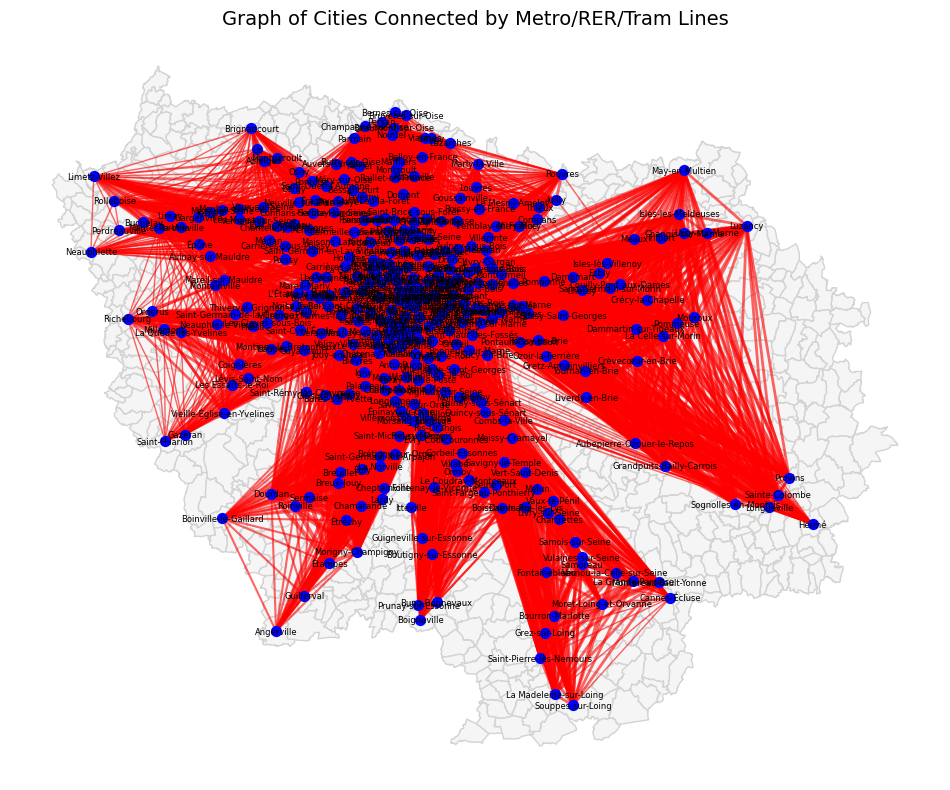

In [15]:
import matplotlib.pyplot as plt
import geopandas as gpd
import networkx as nx

# Get centroids for plotting nodes
gdf_comp["centroid"] = gdf_comp.geometry.centroid
centroids = dict(zip(gdf_comp["codgeo"], gdf_comp["centroid"]))

# Create mapping for labels
code_to_name = dict(zip(
    gdf_comp["codgeo"], 
    gdf_comp["nom_officiel_commune_arrondissement_municipal"]
))

# Plot map background
fig, ax = plt.subplots(figsize=(12, 12))
gdf_comp.plot(ax=ax, facecolor="whitesmoke", edgecolor="lightgrey")

# Draw edges as straight lines between centroids
for u, v, data in G.edges(data=True):
    if u in centroids and v in centroids:
        x1, y1 = centroids[u].x, centroids[u].y
        x2, y2 = centroids[v].x, centroids[v].y
        ax.plot([x1, x2], [y1, y2], 
                color="red", 
                linewidth=data["weight"] * 0.5, 
                alpha=0.6)

# Draw nodes at centroids
for node in G.nodes():
    if node in centroids:
        ax.scatter(centroids[node].x, centroids[node].y, 
                   s=50, color="blue", zorder=3)

# Add city names as labels
for node in G.nodes():
    if node in centroids:
        ax.text(centroids[node].x, centroids[node].y, 
                code_to_name.get(node, node), 
                fontsize=6, ha="center", va="center", zorder=4)

plt.title("Graph of Cities Connected by Metro/RER/Tram Lines", fontsize=14)
plt.axis("off")
plt.show()

### Only adjacent stops

In [69]:
import networkx as nx

G = nx.Graph()
# Build adjacency (queen contiguity: touches at least at a point)
neighbors = {}
for idx, city in gdf_comp.iterrows():
    touching = gdf_comp[gdf_comp.geometry.touches(city.geometry)]["codgeo"].tolist()
    neighbors[city["codgeo"]] = touching


for line_id, group in stations.groupby("idrefligc"):
    # Cities served by this line
    line_cities = group["codgeo"].unique()
    
    # Determine transport mode weight
    modes = {mode: int(group[mode].max()) for mode in weights.keys()}
    line_mode = max(modes, key=lambda m: modes[m])
    if modes[line_mode] == 0:
        continue
    line_weight = weights[line_mode]
    
    # Link only adjacent city pairs
    for c1 in line_cities:
        for c2 in neighbors.get(c1, []):
            if c2 in line_cities and c1 != c2:
                if G.has_edge(c1, c2):
                    if line_id not in G[c1][c2]["lines"]:  
                        # If it's a NEW line for this edge:
                        G[c1][c2]["weight"] += line_weight
                        G[c1][c2]["lines"].add(line_id)
                else:
                    G.add_edge(c1, c2, weight=line_weight, lines={line_id})

In [64]:
neighbors['92073']

['92062', '92063', '92064', '92050', '75116']

In [65]:
labels['92062']

'Puteaux'

In [66]:
G.edges(['92073'])

EdgeDataView([('92073', '92064'), ('92073', '92062'), ('92073', '92050')])

In [70]:
G.edges['92073', '92064']

{'weight': 5, 'lines': {'C01390', 'C01740', 'C01741'}}

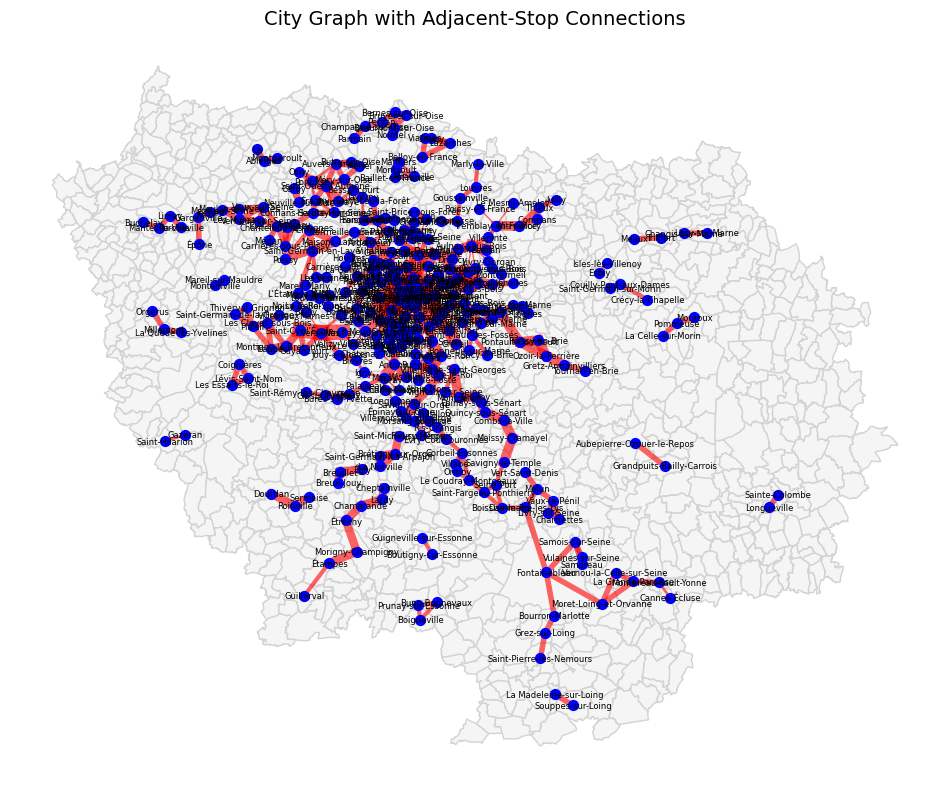

In [71]:
fig, ax = plt.subplots(figsize=(12, 12))
gdf_comp.plot(ax=ax, facecolor="whitesmoke", edgecolor="lightgrey")

for u, v, data in G.edges(data=True):
    if u in centroids and v in centroids:
        x1, y1 = centroids[u].x, centroids[u].y
        x2, y2 = centroids[v].x, centroids[v].y
        ax.plot([x1, x2], [y1, y2], 
                color="red", 
                linewidth=max(0.5, data["weight"]), 
                alpha=0.6)

for node in G.nodes():
    if node in centroids:
        ax.scatter(centroids[node].x, centroids[node].y, 
                   s=50, color="blue", zorder=3)
        ax.text(centroids[node].x, centroids[node].y, 
                code_to_name.get(node, node), 
                fontsize=6, ha="center", va="center", zorder=4)

plt.title("City Graph with Adjacent-Stop Connections", fontsize=14)
plt.axis("off")
plt.show()


In [54]:
labels['92026']

'Courbevoie'

In [53]:
G.edges['92073', '92026']

KeyError: '92026'

In [77]:
from pyvis.network import Network
import networkx as nx

# --- Assuming your data (G, code_to_name) is already loaded ---

# 1. Initialize the pyvis network object
# 'notebook=True' is generally needed for displaying in Jupyter environments
# 'height' and 'width' set the size of the visualization
net = Network(height="750px", width="100%", bgcolor="#222222", font_color="white", notebook=True)

# 2. Add Nodes and Edges from the NetworkX graph

# First, calculate necessary properties for styling
max_weight = max(data.get("weight", 1) for u, v, data in G.edges(data=True)) or 1
node_degrees = dict(G.degree())
max_degree = max(node_degrees.values()) if node_degrees else 1

# Iterate through nodes to add them with calculated properties
for node_code, degree in node_degrees.items():
    # Get the official city name for the label/title
    city_name = code_to_name.get(node_code, node_code)
    
    # Calculate size based on degree (more connections = bigger node)
    node_size = 10 + 20 * (degree / max_degree)
    
    # Create a hover title for interactivity
    title_text = f"City: {city_name}<br>Connections: {degree}"
    
    # Add the node to the pyvis network
    net.add_node(
        n_id=node_code, 
        label=city_name,
        title=title_text,
        size=node_size,
        group=degree # Grouping can be used for coloring nodes by degree
    )

# Iterate through edges to add them with calculated weights
for u, v, data in G.edges(data=True):
    weight = data.get("weight", 1)
    
    # Calculate thickness based on the 'weight' attribute
    edge_width = max(0.5, 5 * (weight / max_weight))
    
    # Add the edge to the pyvis network
    net.add_edge(
        source=u, 
        to=v, 
        value=weight, # 'value' is used by pyvis physics and default styling
        title=f"Shared Lines Weight: {weight}", # Hover text for the edge
        width=edge_width,
        color={'color': '#ff9999', 'highlight': '#ff0000'}
    )

# 3. Configure Physics and Display

# Tune physics for better initial layout
net.set_options("""
var options = {
  "physics": {
    "barnesHut": {
      "centralGravity": 0.3,
      "gravitationalConstant": -15000,
      "springConstant": 0.002,
      "damping": 0.9
    },
    "maxVelocity": 100,
    "minVelocity": 0.75
  }
}
""")

# 4. Save and show the interactive plot
output_filename = 'pyvis_city_network.html'
net.show(output_filename)

print(f"Interactive graph saved to {output_filename}.")
print("Open the HTML file in your web browser to view the interactive visualization.")

pyvis_city_network.html
Interactive graph saved to pyvis_city_network.html.
Open the HTML file in your web browser to view the interactive visualization.


### GTFS 

In [4]:
import pandas as pd

GTFS_folder = "data/France/transportsIDF/gtfs/"

ROUTE_TYPE_MAP = {
    0: "Tramway",
    1: "Metro",
    2: "Train",
    3: "Bus",
    4: "Ferry",
    5: "Cable tram / Aerial lift",
    6: "Funicular (alt code)",
    7: "Funicular",
    11: "Trolleybus",
    12: "Monorail"
}

stops = pd.read_csv(GTFS_folder + "stops.txt")
stop_times = pd.read_csv(GTFS_folder + "stop_times.txt")
trips = pd.read_csv(GTFS_folder + "trips.txt")
routes = pd.read_csv(GTFS_folder + "routes.txt")
# Ensure trips has unique trip_id -> route_id mapping (keep first route_id if duplicates)
trip_to_route = trips.loc[:, ["trip_id", "route_id"]].drop_duplicates(subset="trip_id", keep="first")

# Ensure routes has route_id -> route_type (keep first if duplicates)
route_type_df = routes.loc[:, ["route_id", "route_type"]].drop_duplicates(subset="route_id", keep="first")

# Merge trip->route into stop_times
stop_times_enriched = stop_times.merge(trip_to_route, on="trip_id", how="left", validate="m:1")

# Merge route_type into the enriched table
stop_times_enriched = stop_times_enriched.merge(route_type_df, on="route_id", how="left", validate="m:1")

# Coerce route_type to numeric where possible, fill missing with -1
stop_times_enriched["route_type_num"] = pd.to_numeric(stop_times_enriched["route_type"], errors="coerce").fillna(-1).astype(int)

# Map to friendly names
stop_times_enriched["route_type_name"] = stop_times_enriched["route_type_num"].map(ROUTE_TYPE_MAP).fillna("Other")

# Now for a specific stop_time row (by index or column), you can safely read:
# If your original stop_times index is preserved, you can use .loc on stop_times_enriched
stop_time_id = 0
row = stop_times_enriched.loc[stop_time_id] if stop_time_id in stop_times_enriched.index else stop_times_enriched[stop_times_enriched.get("stop_time_id")==stop_time_id].iloc[0]
print(row["trip_id"], row["route_id"], row["route_type_num"], row["route_type_name"])

/var/folders/qc/fbm2wz190nqd87d2mq7l90_80000gn/T/ipykernel_96200/950378949.py:19: DtypeWarning: Columns (12,13) have mixed types. Specify dtype option on import or set low_memory=False.
  stop_times = pd.read_csv(GTFS_folder + "stop_times.txt")
/var/folders/qc/fbm2wz190nqd87d2mq7l90_80000gn/T/ipykernel_96200/950378949.py:20: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  trips = pd.read_csv(GTFS_folder + "trips.txt")


IDFM:KRO6:208019-C02060-696-260 IDFM:C02060 3 Bus


In [5]:
import pandas as pd
import numpy as np
import geopandas as gpd
import networkx as nx
from shapely.geometry import Point
from collections import defaultdict

# === Parameters & capacity map (edit as you like) ===
CAPACITY_BY_ROUTE_TYPE = {
    0: 300,   # Tramway
    1: 800,   # Metro
    2: 1600,  # Train (e.g., RER / regional)
    3: 60,    # Bus
    4: 150,   # Ferry
    5: 100,   # Cable tram / aerial lift
    6: 100,   # Funicular alt code
    7: 40,    # Funicular
    11: 80,   # Trolleybus
    12: 120   # Monorail
}
DEFAULT_CAPACITY = 60

# Smoothing param: avoids division-by-zero & controls time penalty strength
TAU = 1.0  # minutes (tweak: larger TAU -> travel-time matters less)
MIN_TRAVEL_TIME = 0.1  # minutes floor to avoid zero

# === 1) Map trip -> capacity per vehicle ===
# take first route_type observed for a trip (vectorized)
trip_route_type = stop_times_enriched.groupby('trip_id')['route_type_num'].first()
trip_capacity = trip_route_type.map(CAPACITY_BY_ROUTE_TYPE).fillna(DEFAULT_CAPACITY).astype(float)
# trip_capacity is a Series: index=trip_id, value=capacity_per_vehicle

# === 2) Create per-trip consecutive-stop records (vectorized) ===
# sort and create shifted next_stop, next_departure
st = stop_times_enriched.copy()
st = st.sort_values(['trip_id', 'stop_sequence'])
st['next_stop'] = st.groupby('trip_id')['stop_id'].shift(-1)
st['next_departure_time'] = st.groupby('trip_id')['departure_time'].shift(-1)
# drop rows where next_stop is NaN (last stop in trip)
pairs = st.dropna(subset=['next_stop']).loc[:, ['trip_id', 'stop_id', 'next_stop', 'departure_time', 'next_departure_time']].rename(
    columns={'stop_id': 'u', 'next_stop': 'v', 'departure_time': 'dep_u', 'next_departure_time': 'dep_v'})

# compute travel time robustly in minutes (handle midnight wrap)
# convert to timedelta
dep_u_td = pd.to_timedelta(pairs['dep_u'])
dep_v_td = pd.to_timedelta(pairs['dep_v'])
delta = dep_v_td - dep_u_td
# if negative, assume next day and add 24h
neg_mask = delta.dt.total_seconds() < 0
if neg_mask.any():
    delta.loc[neg_mask] = delta.loc[neg_mask] + pd.Timedelta(days=1)
travel_time_min = delta.dt.total_seconds() / 60.0
# floor small/zero travel times
travel_time_min = travel_time_min.clip(lower=MIN_TRAVEL_TIME)

pairs = pairs.assign(travel_time_min=travel_time_min.values)

# add capacity per trip (vectorized)
pairs['capacity_per_trip'] = pairs['trip_id'].map(trip_capacity).fillna(DEFAULT_CAPACITY)

# compute per-trip contribution
pairs['contrib'] = pairs['capacity_per_trip'] / (TAU + pairs['travel_time_min'])

# === 3) Aggregate to stop-stop level (undirected aggregation later) ===
# group by ordered pair (u,v) exactly as they appear on trips (directed)
stop_edge_agg = pairs.groupby(['u', 'v']).agg(
    trips=('trip_id', 'size'),
    capacity_sum=('capacity_per_trip', 'sum'),
    travel_time_sum=('travel_time_min', 'sum'),
    contrib_sum=('contrib', 'sum')
).reset_index()
# compute trips-weighted average travel time per directed stop-stop edge
stop_edge_agg['avg_travel_time'] = stop_edge_agg['travel_time_sum'] / stop_edge_agg['trips']

# === 4) Make edges undirected by merging (u,v) and (v,u) into canonical (a,b) with sums ===
# canonical ordering (lexicographic works for stop ids)
stop_edge_agg['a'] = stop_edge_agg[['u', 'v']].min(axis=1)
stop_edge_agg['b'] = stop_edge_agg[['u', 'v']].max(axis=1)

undirected_edges = stop_edge_agg.groupby(['a', 'b']).agg(
    trips=('trips', 'sum'),
    capacity_sum=('capacity_sum', 'sum'),
    contrib_sum=('contrib_sum', 'sum'),
    # compute weighted average travel_time across directed contributions (weight by trips)
    travel_time_sum=('travel_time_sum', 'sum')
).reset_index()
undirected_edges['avg_travel_time'] = undirected_edges['travel_time_sum'] / undirected_edges['trips']

# Build UG_GTFS (stop-level undirected graph) from undirected_edges
UG_GTFS = nx.Graph()
# add nodes with attributes from stops DataFrame
for _, r in stops.iterrows():
    UG_GTFS.add_node(r['stop_id'], name=r.get('stop_name'), lat=r.get('stop_lat'), lon=r.get('stop_lon'))

# add undirected edges with aggregated attributes, importantly 'contrib_sum'
for _, r in undirected_edges.iterrows():
    a, b = r['a'], r['b']
    UG_GTFS.add_edge(a, b,
                     trips=int(r['trips']),
                     capacity_sum=float(r['capacity_sum']),
                     avg_travel_time=float(r['avg_travel_time']),
                     contrib_sum=float(r['contrib_sum']))

# We also store a per-edge connectivity score = contrib_sum
for u, v, d in UG_GTFS.edges(data=True):
    d['weight'] = d['contrib_sum']

# === 5) Map stops -> cities (spatial join) ===
stops_rows = []
for n, attr in UG_GTFS.nodes(data=True):
    lat = attr.get('lat'); lon = attr.get('lon')
    if lat is None or lon is None:
        continue
    stops_rows.append({'stop_id': n, 'lat': lat, 'lon': lon, 'geometry': Point(lon, lat)})

stops_gdf = gpd.GeoDataFrame(stops_rows, crs=gdf_comp.crs)

# List of columns to normalize
cols_to_norm = [
    "p20_pop", "p14_pop", "superf", "p20_men", "naisd22", "decesd22",
    "p20_log", "p20_rp", "p20_rsecocc", "p20_logvac", "med20",
    "p20_emplt", "p20_emplt_sal", "p14_emplt", "ettot21", "etaz21",
    "etbe21", "etfz21", "etgu21", "ettefp1021"
]

# Normalize each column and create a new one with suffix "_norm"
for col in cols_to_norm:
    if col in gdf_comp.columns:
        gdf_comp[col] = pd.to_numeric(gdf_comp[col], errors="coerce")
        col_min = gdf_comp[col].min()
        col_max = gdf_comp[col].max()
        if col_max > col_min:  # avoid division by zero
            gdf_comp[f"{col}_norm"] = (gdf_comp[col] - col_min) / (col_max - col_min)
        else:
            gdf_comp[f"{col}_norm"] = 0.0

# spatial join
stops_gdf = gpd.sjoin(stops_gdf, gdf_comp[['codgeo', 'geometry']], how='left', predicate='within')
stop_to_city = stops_gdf.set_index('stop_id')['codgeo'].to_dict()

# === 6) Aggregate to city-city edges by summing contribs (monotonic) ===
city_rows = []
city_edge_acc = defaultdict(lambda: {'trips': 0, 'capacity': 0.0, 'contrib': 0.0, 'travel_time_sum': 0.0})

for u, v, d in UG_GTFS.edges(data=True):
    city_u = stop_to_city.get(u)
    city_v = stop_to_city.get(v)
    if city_u is None or city_v is None or (isinstance(city_u, float) and np.isnan(city_u)) or (isinstance(city_v, float) and np.isnan(city_v)):
        continue
    if city_u == city_v:
        continue  # skip intra-city links if desired
    # canonical city pair as strings
    a, b = (str(city_u), str(city_v)) if str(city_u) <= str(city_v) else (str(city_v), str(city_u))
    city_edge_acc[(a, b)]['trips'] += d.get('trips', 0)
    city_edge_acc[(a, b)]['capacity'] += d.get('capacity_sum', 0.0)
    city_edge_acc[(a, b)]['contrib'] += d.get('contrib_sum', 0.0)
    city_edge_acc[(a, b)]['travel_time_sum'] += d.get('avg_travel_time', 0.0) * d.get('trips', 0)

# Build UG_CITIES_GTFS graph
UG_CITIES_GTFS = nx.Graph()
# add city nodes from gdf_comp
for idx, row in gdf_comp.iterrows():
    c = str(row['codgeo'])
    UG_CITIES_GTFS.add_node(c,
                            name=row.get('nom_officiel_commune_arrondissement_municipal', "Unknown"),
                            geometry=row['geometry'],
                            p20_pop=row.get('p20_pop_norm', 0),
                            p14_pop=row.get('p14_pop_norm', 0),
                            superf=row.get('superf_norm', 0),
                            p20_men=row.get('p20_men_norm', 0),
                            naisd22=row.get('naisd22_norm', 0),
                            decesd22=row.get('decesd22_norm', 0),
                            p20_log=row.get('p20_log_norm', 0),
                            p20_rp=row.get('p20_rp_norm', 0),
                            p20_rsecocc=row.get('p20_rsecocc_norm', 0),
                            p20_logvac=row.get('p20_logvac_norm', 0),
                            med20=row.get('med20_norm', 0),
                            p20_emplt=row.get('p20_emplt_norm', 0),
                            p20_emplt_sal=row.get('p20_emplt_sal_norm', 0),
                            p14_emplt=row.get('p14_emplt_norm', 0),
                            ettot21=row.get('ettot21_norm', 0),
                            etaz21=row.get('etaz21_norm', 0),
                            etbe21=row.get('etbe21_norm', 0),
                            etfz21=row.get('etfz21_norm', 0),
                            etgu21=row.get('etgu21_norm', 0),
                            ettefp1021=row.get('ettefp1021_norm', 0),
                            )

# add edges with aggregated metrics; final weight = sum of contributions (monotonic)
for (a, b), vals in city_edge_acc.items():
    trips = vals['trips']
    capacity_sum = vals['capacity']
    contrib_sum = vals['contrib']
    avg_travel_time = (vals['travel_time_sum'] / trips) if trips > 0 else None

    UG_CITIES_GTFS.add_edge(a, b,
                            trips=int(trips),
                            capacity_sum=float(capacity_sum),
                            avg_travel_time=(float(avg_travel_time) if avg_travel_time is not None else None),
                            weight=float(contrib_sum))

# optional: normalized weight
weights = [d['weight'] for _,_,d in UG_CITIES_GTFS.edges(data=True)]
if weights:
    wmax = max(weights)
    if wmax > 0:
        for u,v,d in UG_CITIES_GTFS.edges(data=True):
            d['weight_norm'] = d['weight'] / wmax
    else:
        for u,v,d in UG_CITIES_GTFS.edges(data=True):
            d['weight_norm'] = 0.0


In [27]:
gdf_comp.sort_values(by='med20_norm', ascending=False).loc[:, ['codgeo', 'nom_officiel_commune_arrondissement_municipal', 'med20', 'med20_norm']].head(200)


,codgeo,nom_officiel_commune_arrondissement_municipal,med20,med20_norm
80,78406,Milon-la-Chapelle,50140.0,1.000000
592,92051,Neuilly-sur-Seine,45580.0,0.871802
89,75107,Paris 7e Arrondissement,44110.0,0.830475
1126,78571,Saint-Nom-la-Bretèche,43360.0,0.809390
858,75108,Paris 8e Arrondissement,42680.0,0.790273
...,...,...,...,...
756,91600,Soisy-sur-Seine,30410.0,0.445319
63,78194,Dannemarie,30400.0,0.445038
816,91581,Saint-Yon,30380.0,0.444476
482,95210,Enghien-les-Bains,30380.0,0.444476


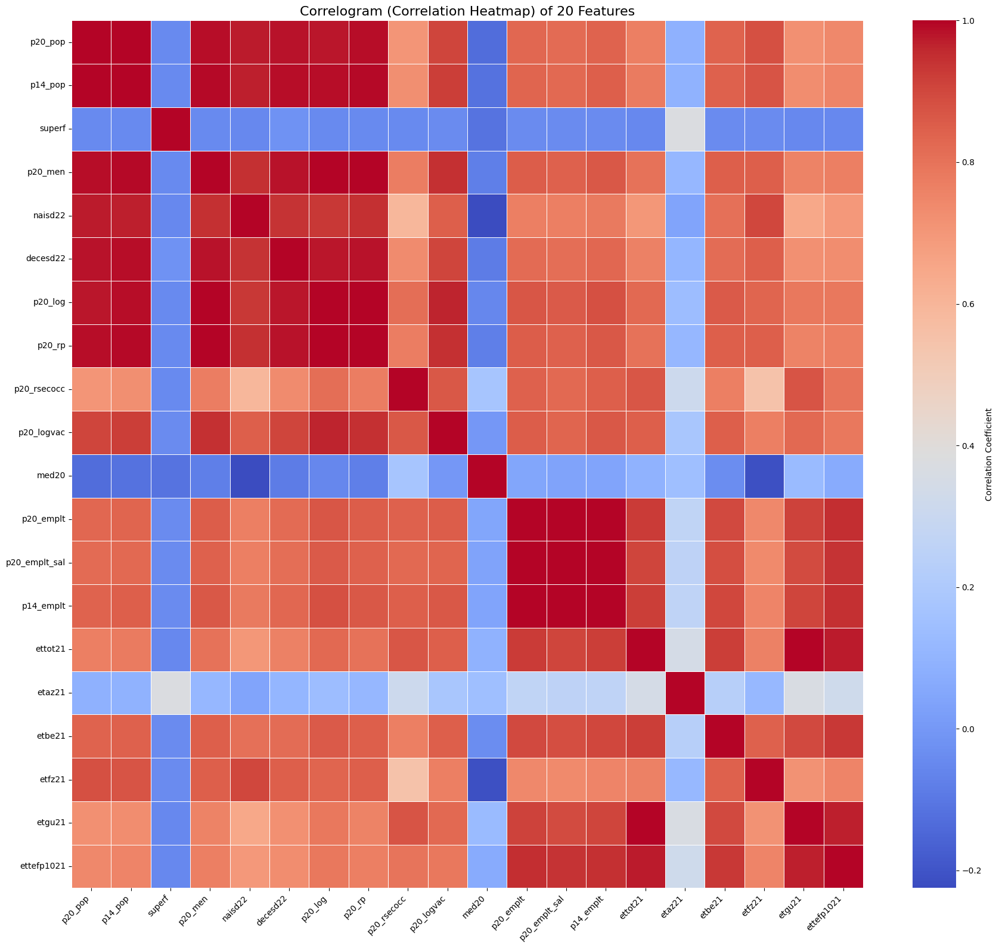

In [ ]:
import seaborn as sns
correlation_matrix = gdf_comp[cols_to_norm].corr()

# 3. Create the correlogram (heatmap)
plt.figure(figsize=(18, 16)) # Adjust size for 20x20 matrix
sns.heatmap(
    correlation_matrix,
    annot=False, # Don't show numeric values for clarity with 20 columns
    cmap='coolwarm',
    fmt=".2f",
    linewidths=.5,
    cbar_kws={'label': 'Correlation Coefficient'},
    
)

# Customize plot
plt.title('Correlogram (Correlation Heatmap) of 20 Features', fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()



In [6]:
UG_CITIES_GTFS.nodes["92073"]

{'name': 'Suresnes',
 'geometry': <POLYGON ((2.208 48.874, 2.207 48.874, 2.208 48.872, 2.209 48.872, 2.209 48....>,
 'p20_pop': 0.21554868880395037,
 'p14_pop': 0.20609156036746523,
 'superf': 0.021516631774831357,
 'p20_men': 0.17863331811630423,
 'naisd22': 0.2593726090283091,
 'decesd22': 0.18313253012048192,
 'p20_log': 0.15699782127606715,
 'p20_rp': 0.17863331811630423,
 'p20_rsecocc': 0.03490902936199389,
 'p20_logvac': 0.09600226301893156,
 'med20': 0.4571267922406522,
 'p20_emplt': 0.14700512874630128,
 'p20_emplt_sal': 0.15359241954795108,
 'p14_emplt': 0.17503685648782027,
 'ettot21': 0.0695060373216246,
 'etaz21': 0.0,
 'etbe21': 0.14214463840399003,
 'etfz21': 0.10784313725490197,
 'etgu21': 0.06257889115448102,
 'ettefp1021': 0.07723772858517805}

In [7]:
UG_CITIES_GTFS.edges(["92073"])

EdgeDataView([('92073', '92064'), ('92073', '92062'), ('92073', '92063'), ('92073', '75116'), ('92073', '92026'), ('92073', '92033'), ('92073', '92050'), ('92073', '92047')])

In [8]:
UG_CITIES_GTFS.edges["92073", "92064"]

{'trips': 4029,
 'capacity_sum': 2642600.0,
 'avg_travel_time': 2.76030032266071,
 'weight': 598892.9337866036,
 'weight_norm': 0.08787613245103841}

In [9]:
UG_CITIES_GTFS.edges["92073", "92063"]

{'trips': 1745,
 'capacity_sum': 104700.0,
 'avg_travel_time': 1.4693409742120345,
 'weight': 44205.0,
 'weight_norm': 0.006486241890411574}

In [10]:
UG_CITIES_GTFS.nodes["92063"]

{'name': 'Rueil-Malmaison',
 'geometry': <POLYGON ((2.198 48.855, 2.199 48.855, 2.199 48.855, 2.201 48.857, 2.202 48....>,
 'p20_pop': 0.34099378069881064,
 'p14_pop': 0.33644653313050793,
 'superf': 0.08496161898115841,
 'p20_men': 0.27654313857283663,
 'naisd22': 0.37872991583779647,
 'decesd22': 0.3289156626506024,
 'p20_log': 0.24430787735557555,
 'p20_rp': 0.27654313857283663,
 'p20_rsecocc': 0.04611610967393738,
 'p20_logvac': 0.17075907314831618,
 'med20': 0.49114422265954455,
 'p20_emplt': 0.21958029566374188,
 'p20_emplt_sal': 0.22971678027684123,
 'p14_emplt': 0.266203443543162,
 'ettot21': 0.10867178924259056,
 'etaz21': 0.038461538461538464,
 'etbe21': 0.2169576059850374,
 'etfz21': 0.23093681917211328,
 'etgu21': 0.09432954655791824,
 'ettefp1021': 0.12584215591915304}

In [12]:
UG_GTFS.nodes['IDFM:monomodalStopPlace:473843']

{'name': 'Cité Universitaire',
 'lat': 48.82150600684166,
 'lon': 2.3388576809777035}

In [13]:
UG_GTFS.edges(['IDFM:monomodalStopPlace:473843'])

EdgeDataView([('IDFM:monomodalStopPlace:473843', 'IDFM:monomodalStopPlace:43097'), ('IDFM:monomodalStopPlace:473843', 'IDFM:monomodalStopPlace:45877'), ('IDFM:monomodalStopPlace:473843', 'IDFM:monomodalStopPlace:473890')])

In [14]:
UG_GTFS.edges['IDFM:monomodalStopPlace:473843', 'IDFM:monomodalStopPlace:473890']

{'trips': 3677,
 'capacity_sum': 5883200.0,
 'avg_travel_time': 2.508167890490436,
 'contrib_sum': 1682321.5687231575,
 'weight': 1682321.5687231575}

In [15]:
len(UG_GTFS.nodes())

53536

/var/folders/qc/fbm2wz190nqd87d2mq7l90_80000gn/T/ipykernel_96200/4227116396.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf_comp["centroid"] = gdf_comp.geometry.centroid


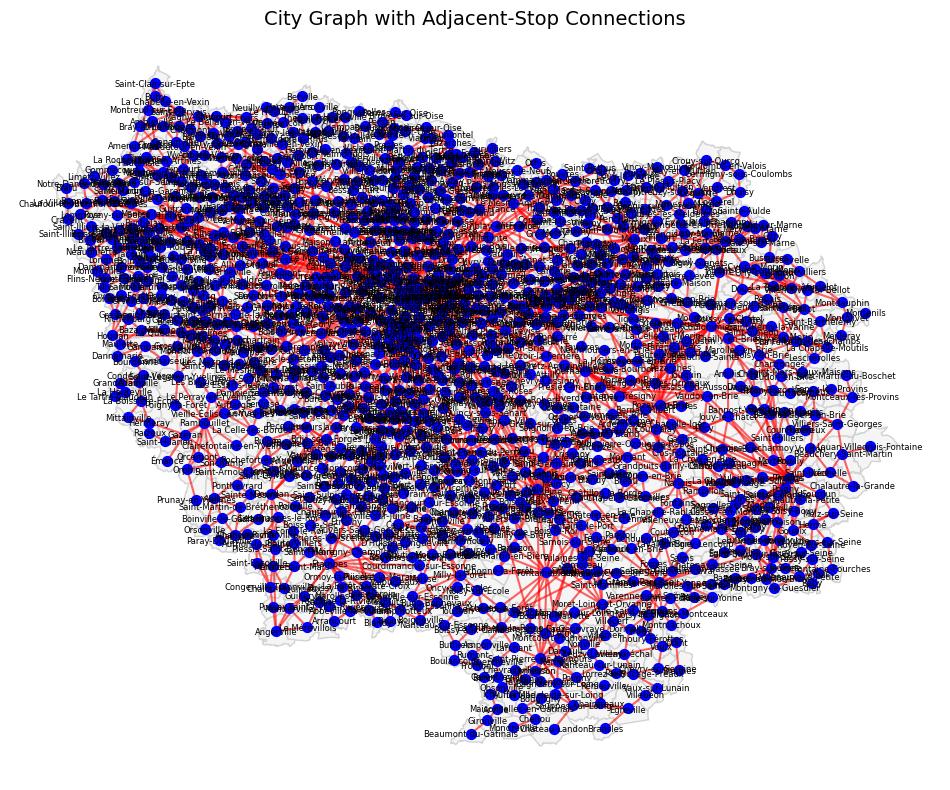

In [16]:
gdf_comp["centroid"] = gdf_comp.geometry.centroid
centroids = dict(zip(gdf_comp["codgeo"], gdf_comp["centroid"]))
code_to_name = dict(zip(
    gdf_comp["codgeo"], 
    gdf_comp["nom_officiel_commune_arrondissement_municipal"]
))

fig, ax = plt.subplots(figsize=(12, 12))
gdf_comp.plot(ax=ax, facecolor="whitesmoke", edgecolor="lightgrey")

for u, v, data in UG_CITIES_GTFS.edges(data=True):
    if u in centroids and v in centroids:
        x1, y1 = centroids[u].x, centroids[u].y
        x2, y2 = centroids[v].x, centroids[v].y
        ax.plot([x1, x2], [y1, y2], 
                color="red", 
                #linewidth=max(0.5, data["weight"]), 
                alpha=0.6)

for node in UG_CITIES_GTFS.nodes():
    if node in centroids:
        ax.scatter(centroids[node].x, centroids[node].y, 
                   s=50, color="blue", zorder=3)
        ax.text(centroids[node].x, centroids[node].y, 
                code_to_name.get(node, node), 
                fontsize=6, ha="center", va="center", zorder=4)

plt.title("City Graph with Adjacent-Stop Connections", fontsize=14)
plt.axis("off")
plt.show()

In [ ]:
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import pandas as pd
import numpy as np

# Calculate centroids and mappings (assuming your original data structure)
gdf_comp["centroid"] = gdf_comp.geometry.centroid
centroids = dict(zip(gdf_comp["codgeo"], gdf_comp["centroid"]))
code_to_name = dict(zip(
    gdf_comp["codgeo"],
    gdf_comp["nom_officiel_commune_arrondissement_municipal"]
))

# Create figure
fig = go.Figure()

# Add polygon boundaries
for idx, row in gdf_comp.iterrows():
    if hasattr(row.geometry, 'exterior'):
        # Single polygon
        coords = list(row.geometry.exterior.coords)
    else:
        # MultiPolygon - take the largest polygon
        coords = list(max(row.geometry.geoms, key=lambda x: x.area).exterior.coords)
    
    x_coords = [coord[0] for coord in coords]
    y_coords = [coord[1] for coord in coords]
    
    fig.add_trace(go.Scatter(
        x=x_coords,
        y=y_coords,
        mode='lines',
        line=dict(color='lightgrey', width=0.5),
        fill='toself',
        fillcolor='rgba(245, 245, 245, 0.5)',
        hoverinfo='skip',
        showlegend=False,
        name='Boundary'
    ))

# Add network edges with weight_norm coloring
for u, v, data in UG_CITIES_GTFS.edges(data=True):
    if u in centroids and v in centroids:
        x1, y1 = centroids[u].x, centroids[u].y
        x2, y2 = centroids[v].x, centroids[v].y
        
        # Get weight_norm for color mapping
        weight_norm = data.get('weight_norm', 0.5)
        
        # Map weight_norm to color (red scale)
        #color_intensity = np.log(weight_norm + 1) / np.log(2)#weight_norm**0.1
        color_intensity = max((weight_norm**0.2 -0.5), 0)/0.5
        #color_intensity = weight_norm
        #color = f'rgba({int(255 * color_intensity)}, {int(50 * (1-color_intensity))}, {int(50 * (1-color_intensity))}, 0.7)'
        R = int(255 * (0.35 + 0.65 * color_intensity))
        G = int(255 * (0.15 + 0.75 * (color_intensity ** 1.5)))
        B = int(255 * (0.15 + 0.5 * color_intensity - 0.5 * (color_intensity ** 2)))

        # Ensure values are within the 0-255 range (though the formulas above should usually stay within bounds)
        R = max(0, min(255, R))
        G = max(0, min(255, G))
        B = max(0, min(255, B))

        color = f'rgba({R}, {G}, {B}, 0.7)'
        
        fig.add_trace(go.Scatter(
            x=[x1, x2],
            y=[y1, y2],
            mode='lines',
            line=dict(color=color, width=max(0.5, weight_norm * 3)),
            hovertemplate=f"{code_to_name.get(u, u)} ↔ {code_to_name.get(v, v)}<br>Weight: {data.get('weight', 1)}<br>Weight norm: {weight_norm:.3f}<extra></extra>",
            showlegend=False,
            name='Connection'
        ))

# Add city nodes
node_x = []
node_y = []
node_text = []
node_names = []

for node in UG_CITIES_GTFS.nodes():
    if node in centroids:
        node_x.append(centroids[node].x)
        node_y.append(centroids[node].y)
        city_name = code_to_name.get(node, node)
        node_names.append(city_name)
        
        # Get degree (number of connections)
        degree = UG_CITIES_GTFS.degree(node)
        node_text.append(f"{city_name}<br>Connections: {degree}")

fig.add_trace(go.Scatter(
    x=node_x,
    y=node_y,
    mode='markers+text',
    marker=dict(
        size=8,
        color='blue',
        line=dict(width=1, color='white')
    ),
    text=node_names,
    textposition="middle center",
    textfont=dict(size=8),
    hovertext=node_text,
    hoverinfo='text',
    showlegend=False,
    name='Cities'
))

# Update layout for interactivity
fig.update_layout(
    title={
        'text': "Interactive City Graph with Adjacent-Stop Connections",
        'x': 0.5,
        'xanchor': 'center'
    },
    showlegend=False,
    hovermode='closest',
    margin=dict(b=20,l=5,r=5,t=40),
    annotations=[
        dict(
            text="Hover over cities for details. Drag to pan, scroll to zoom.",
            showarrow=False,
            xref="paper", yref="paper",
            x=0.005, y=-0.002,
            font=dict(color="grey", size=10)
        )
    ],
    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
    plot_bgcolor='white'
)

# Enable zoom and pan
fig.update_layout(
    dragmode='pan',
)

# Show the interactive plot
fig.show()

# Optional: Save as HTML
#fig.write_html("interactive_city_graph.html")

/var/folders/qc/fbm2wz190nqd87d2mq7l90_80000gn/T/ipykernel_95561/1092514196.py:8: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.




In [43]:
adjacency_matrix = nx.adjacency_matrix(UG_CITIES_GTFS).toarray()

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import torch


def plot_correlogram(*correlation_matrices, titles=None, cmap='viridis', organ_names_dict=None, 
                     remove_diagonal=False, triangular=False, annot=False, savefile=None):
    """
    Plots multiple correlograms (NumPy arrays) in a row as subplots with a shared color scale and adjusted axis labels.

    Args:
        *correlation_matrices: Variable number of NumPy arrays (correlation matrices).
        titles: Optional list of titles for each correlogram. If None, default titles are used.
        cmap: Optional colormap for the heatmaps.
        organ_names_dict: Optional dictionary mapping indices to organ names. If provided, axis labels are adjusted.
        savefile: Optional file name (without extension) for saving the figure
    """

    num_matrices = len(correlation_matrices)

    if num_matrices == 0:
        print("No correlation matrices provided.")
        return

    if titles is None:
        titles = [f"Correlogram {i+1}" for i in range(num_matrices)]
    elif len(titles) != num_matrices:
        print("Number of titles does not match number of matrices.")
        titles = [f"Correlogram {i+1}" for i in range(num_matrices)]

    plt.rcParams['font.family'] = 'sans-serif'
    plt.rcParams['font.sans-serif'] = ['Helvetica', 'Arial', 'DejaVu Sans']

    numpy_matrices = []
    for matrix in correlation_matrices:
        if torch.is_tensor(matrix):
            matrix = matrix.detach().numpy()
        numpy_matrices.append(matrix)

    correlation_matrices = numpy_matrices

    # Find the global min and max for the color scale
    global_min = min(np.nanmin(corr_matrix) for corr_matrix in correlation_matrices)
    global_max = max(np.nanmax(corr_matrix) for corr_matrix in correlation_matrices)

    if num_matrices == 1:
        plt.figure(figsize=(8 + 2*(organ_names_dict is not None), 8 + 2*(organ_names_dict is not None)))
    else:
        plt.figure(figsize=(12 * num_matrices, 12))

    for i, corr_matrix in enumerate(correlation_matrices):
        if remove_diagonal:
            np.fill_diagonal(corr_matrix, np.nan)
        if triangular:
            mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
        else:
            mask = False

        plt.subplot(1, num_matrices, i + 1)
        ax = sns.heatmap(
            corr_matrix,
            annot=annot,
            cmap=cmap,
            fmt='.2f',
            linewidths=0,
            cbar_kws={"shrink": 0.8},
            annot_kws={"size": 12},
            square=True,
            linecolor='white',
            vmin=global_min,  # Set global min
            vmax=global_max,   # Set global max
            mask=mask
        )
        plt.title(titles[i])

        if organ_names_dict is not None:
            num_organs = corr_matrix.shape[0]
            if len(organ_names_dict) == num_organs:
                organ_names = [organ_names_dict.get(j, f"Index {j}") for j in range(num_organs)]
                ax.set_xticks(np.array(range(num_organs))+0.5)
                ax.set_xticklabels(organ_names, rotation=90)
                ax.set_yticks(np.array(range(num_organs))+0.5)
                ax.set_yticklabels(organ_names, rotation=0)
            else:
                print(f"Warning: Length of organ_names_dict ({len(organ_names_dict)}) does not match matrix size ({num_organs}).")

    plt.tight_layout()
    if savefile is not None:
        plt.savefig(savefile + ".png", dpi=600, bbox_inches='tight')
    plt.show()
    return plt

In [44]:
adjacency_matrix /= np.max(adjacency_matrix)
adjacency_matrix = (adjacency_matrix**0.2 -0.5)
adjacency_matrix = np.where(adjacency_matrix <= 0, 0.0, adjacency_matrix)
adjacency_matrix /= 0.5

In [45]:
np.sum(adjacency_matrix)

170.83831724664157

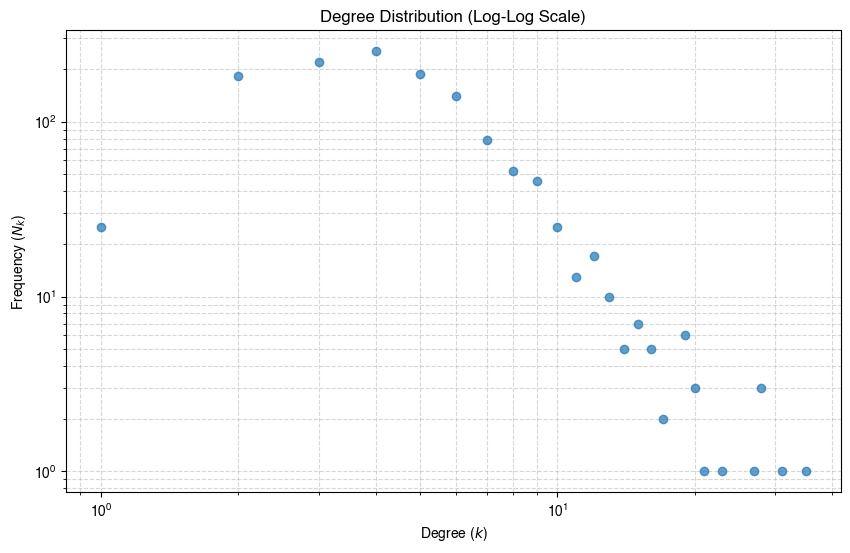

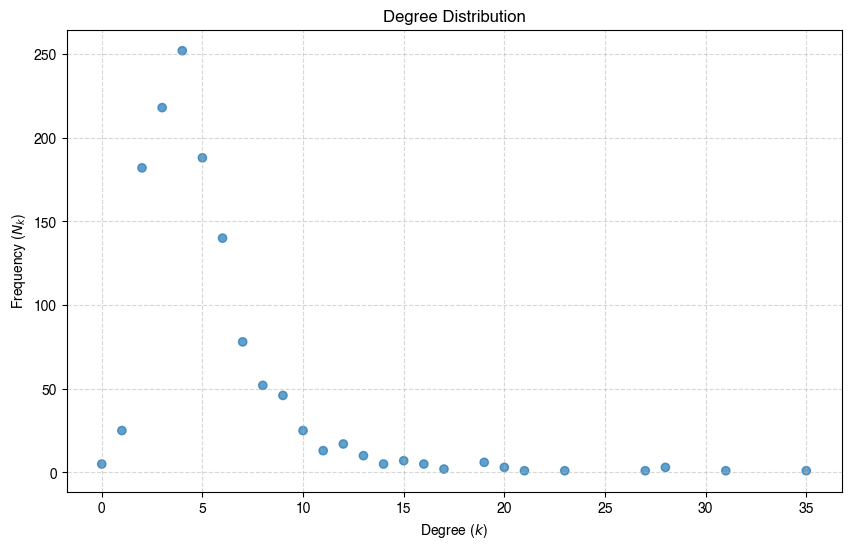

In [ ]:
# 2. Calculate the degree distribution
# Get all degrees from the graph
degrees = [UG_CITIES_GTFS.degree(n) for n in UG_CITIES_GTFS.nodes()]

# Count the frequency of each degree
degree_counts = pd.Series(degrees).value_counts().sort_index()

# Create a DataFrame for plotting (Degree, Frequency)
df_distribution = pd.DataFrame({
    'Degree': degree_counts.index,
    'Frequency': degree_counts.values
})

# 3. Plot the degree distribution
plt.figure(figsize=(10, 6))

# Plot on a log-log scale, which is typical for power-law-like distributions
plt.loglog(df_distribution['Degree'], df_distribution['Frequency'], marker='o', linestyle='', alpha=0.7)

# Add labels and title
plt.title('Degree Distribution (Log-Log Scale)')
plt.xlabel('Degree ($k$)')
plt.ylabel('Frequency ($N_k$)')
plt.grid(True, which="both", ls="--", alpha=0.5)
plt.show()


plt.figure(figsize=(10, 6))

# Plot on a log-log scale, which is typical for power-law-like distributions
plt.scatter(df_distribution['Degree'], df_distribution['Frequency'], marker='o', linestyle='', alpha=0.7)

# Add labels and title
plt.title('Degree Distribution')
plt.xlabel('Degree ($k$)')
plt.ylabel('Frequency ($N_k$)')
plt.grid(True, which="both", ls="--", alpha=0.5)
plt.show()



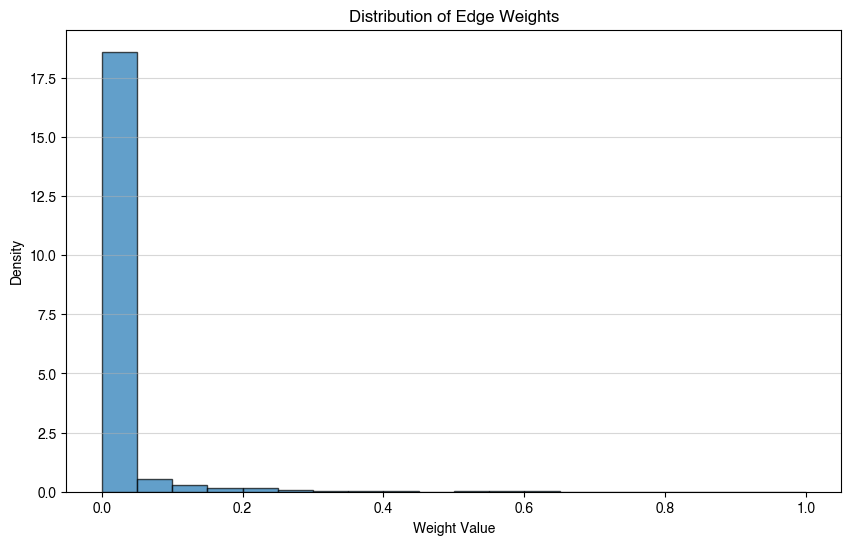

Number of edges (weights): 3309


In [ ]:
weights = [UG_CITIES_GTFS[u][v]['weight_norm'] for u, v in UG_CITIES_GTFS.edges()  if UG_CITIES_GTFS[u][v]['weight_norm'] > 0]

# 4. Plot the distribution of the weights (Histogram)
plt.figure(figsize=(10, 6))

# Plot a histogram of the weights
# Use 'density=True' to show probability density instead of count
plt.hist(weights, bins=20, edgecolor='black', alpha=0.7, density=True)


# Add labels and title
plt.title('Distribution of Edge Weights')
plt.xlabel('Weight Value')
plt.ylabel('Density')
plt.grid(axis='y', alpha=0.5)
plt.show()

print(f"Number of edges (weights): {len(weights)}")

In [30]:
# Force numeric again just to be safe
for col in cols_to_norm:
    if col in gdf_comp.columns:
        gdf_comp[col] = pd.to_numeric(gdf_comp[col], errors="coerce")

# Find rows with missing values in any required column
rows_with_missing = gdf_comp[gdf_comp[cols_to_norm].isnull().any(axis=1)]

# Extract identifiers
missing_codgeo = rows_with_missing["codgeo"].tolist()

print("Number of communes with missing data:", len(missing_codgeo))
print("Example:", missing_codgeo[:10])

# Remove these nodes from the graph
UG_CITIES_GTFS.remove_nodes_from(missing_codgeo)

# Find isolated communes = nodes with degree 0
isolated_nodes = [n for n, deg in UG_CITIES_GTFS.degree() if deg == 0]

print("Number of isolated communes (no edges):", len(isolated_nodes))
print("Example:", isolated_nodes[:10])

# Remove them from the graph
UG_CITIES_GTFS.remove_nodes_from(isolated_nodes)


Number of communes with missing data: 16
Example: ['95141', '78606', '77304', '95144', '95492', '77015', '77356', '95611', '91145', '95387']
Number of isolated communes (no edges): 5
Example: ['77013', '95023', '95094', '95529', '78230']


In [ ]:
# Ensure codgeo is string (to match graph nodes) and set as index
gdf_comp = gdf_comp.copy()
gdf_comp["codgeo"] = gdf_comp["codgeo"].astype(str)
gdf_comp = gdf_comp.set_index("codgeo")

In [39]:
import numpy as np

# Same node order as adjacency matrix
nodes = list(UG_CITIES_GTFS.nodes())
n_nodes = len(nodes)
cols_norm = [c + "_norm" for c in cols_to_norm] 

# Feature matrix
X = np.zeros((n_nodes, len(cols_to_norm)))

for i, node in enumerate(nodes):
    if node in gdf_comp.index:
        X[i, :] = gdf_comp.loc[node, cols_norm].to_numpy(dtype=float)
    else:
        # Missing node: fill with NaNs or 0s
        X[i, :] = np.full(len(cols_to_norm), np.nan)

print("Feature matrix shape:", X.shape)
print("Number of rows with NaNs:", np.isnan(X).any(axis=1).sum())

Feature matrix shape: (1266, 20)
Number of rows with NaNs: 0


In [47]:
np.savetxt("idf_adjacency.csv", adjacency_matrix, fmt='%.6f', delimiter=',')
np.savetxt("idf_attr.csv", X, fmt='%.6f', delimiter=',')